In [2]:
import pandas as pd
import sqlite3
import seaborn as sns

# Read sqlite query results into a pandas DataFrame
def query(query):
    con = sqlite3.connect("output/portfolios.sqlite")
    df = pd.read_sql_query(query, con)
    con.close()
    return df

df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 2
  ORDER BY num_assets DESC
""")

df.head(4)

,assets,num_assets,num_years,avg_return,baseline_lt_return,baseline_st_return,pwr30,swr30,std_dev,ulcer_score,deepest_drawdown,longest_drawdown,startdate_sensitivity,pwr10,pwr10_stdev,pwr10_slope,pwr30_stdev,pwr30_slope
0,|Commodity Futures|,1,52,0.044149,-0.053216,-0.106503,-0.051271,0.024611,0.225833,170.085366,-0.810595,14.0,0.286495,-0.150707,0.061643,-0.344271,0.032025,-0.424845
1,|Dividend Growth|,1,37,0.109792,0.055985,0.022371,0.076779,0.084028,0.134235,4.563646,-0.265817,4.0,0.236222,0.009451,0.032857,-0.214342,0.011314,-0.391581
2,|Emerging|,1,46,0.090119,0.044385,-0.073061,0.039664,0.046235,0.271682,25.244496,-0.542221,12.0,0.445189,-0.020519,0.056880,-0.066363,0.032767,0.339823
3,|Energy|,1,37,0.086031,0.046029,-0.033458,0.063501,0.075301,0.201457,68.655021,-0.478757,14.0,0.245473,-0.052415,0.048891,-0.350869,0.009213,-0.271871


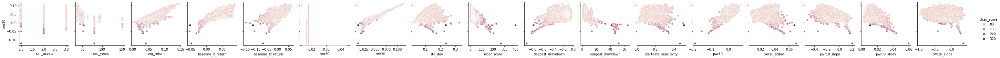

In [6]:
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 4
  ORDER BY ulcer_score DESC
""")
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

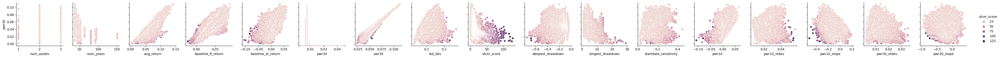

In [8]:
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 4
    AND pwr30 > 0
  ORDER BY ulcer_score DESC
""")
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

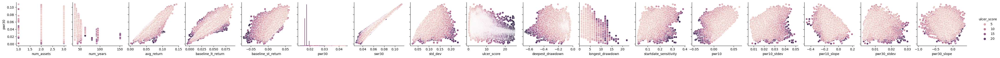

In [9]:
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 4
    AND pwr30 > 0
    AND ulcer_score < 25
  ORDER BY ulcer_score DESC
""")
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

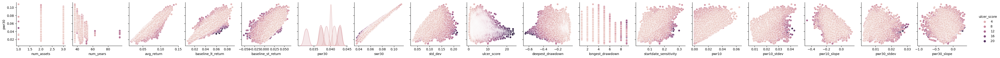

In [13]:
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 4
    AND pwr30 > 0
    AND pwr10 > 0
    AND ulcer_score < 25
  ORDER BY ulcer_score DESC
""")
df.size
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

217872


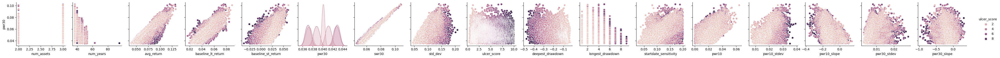

In [17]:
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 4
    AND pwr30 > 0.035
    AND pwr10 > 0
    AND ulcer_score < 10
    AND startdate_sensitivity < 0.2
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

191646


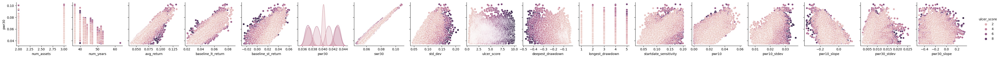

In [20]:
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 4
    AND pwr30 > 0.035
    AND pwr10 > 0
    AND ulcer_score < 10
    AND longest_drawdown < 6
    AND startdate_sensitivity < 0.2
    AND pwr30_slope > -0.5
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

39420


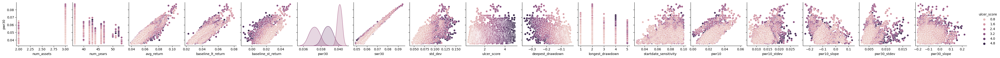

In [21]:
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 4
    AND pwr30 > 0.035
    AND pwr10 > 0
    AND ulcer_score < 5
    AND longest_drawdown < 6
    AND startdate_sensitivity < 0.1
    AND pwr30_slope > -0.5
    AND pwr30_slope > -0.2
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

780804


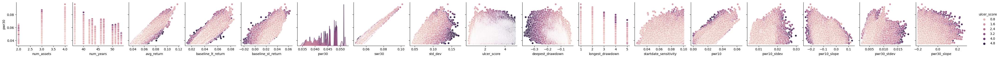

In [22]:
# Expand to 4 assets
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 5
    AND pwr30 > 0.035
    AND pwr10 > 0
    AND ulcer_score < 5
    AND longest_drawdown < 6
    AND startdate_sensitivity < 0.1
    AND pwr30_slope > -0.5
    AND pwr30_slope > -0.2
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

180090


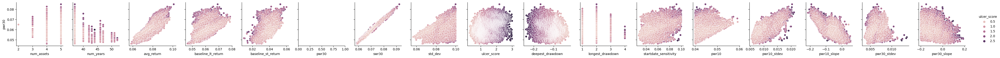

In [24]:
# tighten: pwr10, pwr30, ulcer_score
# expand to 5 assets
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND pwr30 > 0.04
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 3
    AND longest_drawdown < 6
    AND startdate_sensitivity < 0.1
    AND pwr30_slope > -0.5
    AND pwr30_slope > -0.2
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

57150


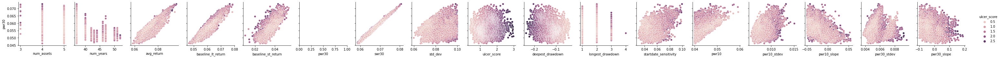

In [3]:
# tighten: slope
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND pwr30 > 0.04
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 3
    AND longest_drawdown < 6
    AND startdate_sensitivity < 0.1
    AND pwr10_slope > -0.05
    AND pwr30_slope > -0.10
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

22176


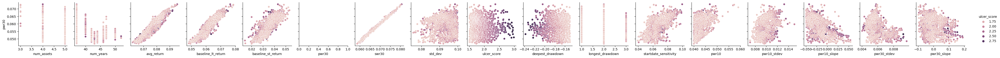

In [4]:
# tighten: deepest_drawdown
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND pwr30 > 0.04
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 3
    AND longest_drawdown < 6
    AND deepest_drawdown < -0.15
    AND startdate_sensitivity < 0.1
    AND pwr10_slope > -0.05
    AND pwr30_slope > -0.10
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

18900


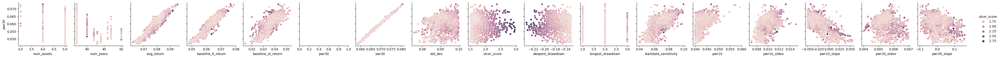

In [5]:
# tighten: pwd30_stdev
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND pwr30 > 0.04
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 3
    AND longest_drawdown < 6
    AND deepest_drawdown < -0.15
    AND startdate_sensitivity < 0.1
    AND pwr30_stdev < 0.007
    AND pwr10_slope > -0.05
    AND pwr30_slope > -0.10
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

12852


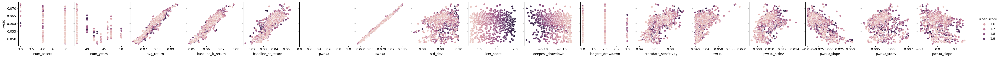

In [6]:
# tighten: ulcer_score
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND pwr30 > 0.04
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 2
    AND longest_drawdown < 6
    AND deepest_drawdown < -0.15
    AND startdate_sensitivity < 0.1
    AND pwr30_stdev < 0.007
    AND pwr10_slope > -0.05
    AND pwr30_slope > -0.10
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

9360


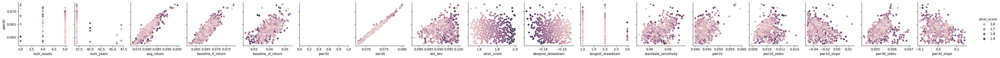

In [7]:
# tighten: pwr30
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND pwr30 > 0.0575
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 2
    AND longest_drawdown < 6
    AND deepest_drawdown < -0.15
    AND startdate_sensitivity < 0.1
    AND pwr30_stdev < 0.007
    AND pwr10_slope > -0.05
    AND pwr30_slope > -0.10
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

7218


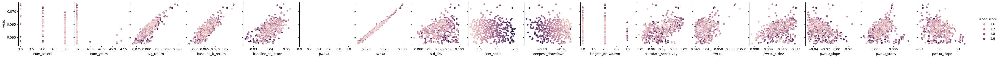

In [8]:
# tighten: pwr10_stdev
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND pwr30 > 0.0575
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 2
    AND longest_drawdown < 6
    AND deepest_drawdown < -0.15
    AND startdate_sensitivity < 0.1
    AND pwr30_stdev < 0.007
    AND pwr10_stdev < 0.011
    AND pwr10_slope > -0.05
    AND pwr30_slope > -0.10
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

6120


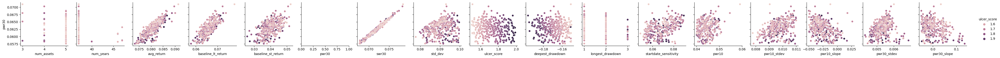

In [9]:
# tighten: pwr30_slope
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND pwr30 > 0.0575
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 2
    AND longest_drawdown < 6
    AND deepest_drawdown < -0.15
    AND startdate_sensitivity < 0.1
    AND pwr30_stdev < 0.007
    AND pwr10_stdev < 0.011
    AND pwr10_slope > -0.05
    AND pwr30_slope > -0.05
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

4518


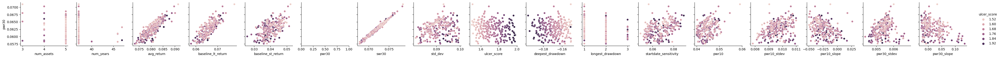

In [10]:
# tighten: pwr30_slope
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND pwr30 > 0.0575
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 2
    AND longest_drawdown < 6
    AND deepest_drawdown < -0.15
    AND startdate_sensitivity < 0.1
    AND pwr30_stdev < 0.007
    AND pwr10_stdev < 0.011
    AND pwr10_slope > -0.05
    AND pwr30_slope > -0.025
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

2178


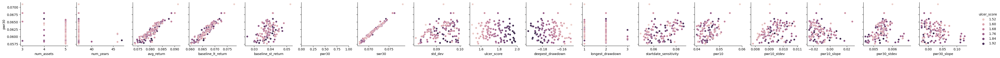

In [11]:
# tighten: pwr10_slope
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND pwr30 > 0.0575
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 2
    AND longest_drawdown < 6
    AND deepest_drawdown < -0.15
    AND startdate_sensitivity < 0.1
    AND pwr30_stdev < 0.007
    AND pwr10_stdev < 0.011
    AND pwr10_slope > -0.025
    AND pwr30_slope > -0.025
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

918


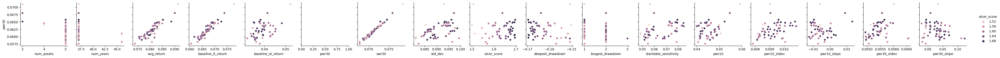

In [12]:
# tighten: ulcer_score
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND pwr30 > 0.0575
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 1.7
    AND longest_drawdown < 6
    AND deepest_drawdown < -0.15
    AND startdate_sensitivity < 0.1
    AND pwr30_stdev < 0.007
    AND pwr10_stdev < 0.011
    AND pwr10_slope > -0.025
    AND pwr30_slope > -0.025
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

540


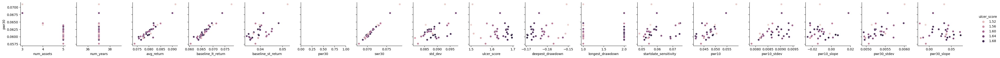

In [15]:
# tighten: ulcer_score
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND pwr30 > 0.0575
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 1.7
    AND longest_drawdown < 6
    AND deepest_drawdown < -0.15
    AND startdate_sensitivity < 0.1
    AND pwr30_stdev < 0.007
    AND pwr10_stdev < 0.0095
    AND pwr10_slope > -0.025
    AND pwr30_slope > -0.025
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

396


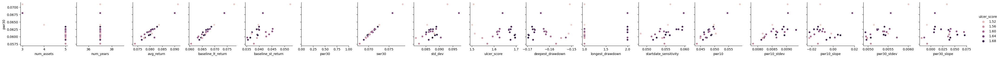

In [16]:
# tighten: startdate_sensitivity
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND pwr30 > 0.0575
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 1.7
    AND longest_drawdown < 6
    AND deepest_drawdown < -0.15
    AND startdate_sensitivity < 0.06
    AND pwr30_stdev < 0.007
    AND pwr10_stdev < 0.0095
    AND pwr10_slope > -0.025
    AND pwr30_slope > -0.025
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

414


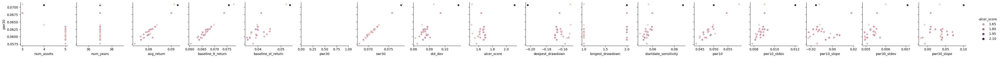

In [17]:
# There are two outlier overachievers!
#  - assets='|Gold|Health Care|SCV|' (slightly negative pwr10_slope)
#  - assets='|Gold|Health Care|SCB|' (slightly positive pwr10_slope)
#
# consider the blend of these top 2 portfolios: assets='|Gold|Health Care|SCB|SCV|'
# Nah, that blend is not right, would have to blend differently,
# like: (33% GLD, 33% Health-care, 17% SCB, 16% SCV)
#
df = query("""
  SELECT * FROM portfolios
  WHERE (num_assets < 6
    AND pwr30 > 0.0575
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 1.7
    AND longest_drawdown < 6
    AND deepest_drawdown < -0.15
    AND startdate_sensitivity < 0.06
    AND pwr30_stdev < 0.007
    AND pwr10_stdev < 0.0095
    AND pwr10_slope > -0.025
    AND pwr30_slope > -0.025
    )
    OR assets='|Gold|Health Care|SCB|SCV|'
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

20


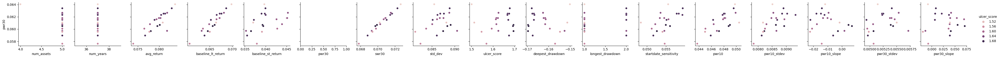

In [25]:
# Besides the two overachievers, what would be in 3rd place?
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND avg_return < 0.085 -- ignore top two overachievers
    AND pwr30 > 0.0575
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 1.7
    AND longest_drawdown < 6
    AND deepest_drawdown < -0.15
    AND startdate_sensitivity < 0.06
    AND pwr30_stdev < 0.007
    AND pwr10_stdev < 0.0095
    AND pwr10_slope > -0.025
    AND pwr30_slope > -0.025
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

11


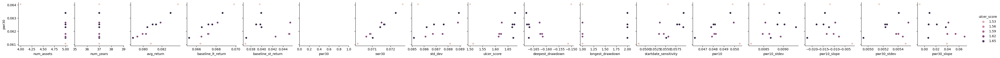

In [28]:
# tighten pwr30
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND avg_return < 0.085 -- ignore top two overachievers
    AND pwr30 > 0.061
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 1.7
    AND longest_drawdown < 6
    AND deepest_drawdown < -0.15
    AND startdate_sensitivity < 0.06
    AND pwr30_stdev < 0.007
    AND pwr10_stdev < 0.0095
    AND pwr10_slope > -0.025
    AND pwr30_slope > -0.025
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

9
0    |Extended Mkt|Gold|Health Care|ITB|REIT|
1    |Extended Mkt|Gold|Health Care|REIT|TBM|
2    |Extended Mkt|Gold|Health Care|REIT|STB|
3             |Gold|Health Care|ITB|REIT|SCB|
4             |Gold|Health Care|REIT|SCB|TBM|
5       |Global Bd|Gold|Health Care|REIT|SCB|
6        |Gold|Health Care|Int'l Bd|REIT|SCB|
7             |Gold|Health Care|ITT|REIT|SCG|
8           |Gold|Health Care|REIT|Wellesley|
Name: assets, dtype: object


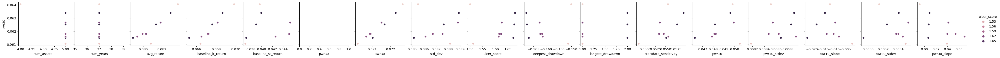

In [31]:
# tighten pwr10_stdev
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND avg_return < 0.085 -- ignore top two overachievers
    AND pwr30 > 0.061
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 1.7
    AND longest_drawdown < 6
    AND deepest_drawdown < -0.15
    AND startdate_sensitivity < 0.06
    AND pwr30_stdev < 0.007
    AND pwr10_stdev < 0.009
    AND pwr10_slope > -0.025
    AND pwr30_slope > -0.025
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
print(df['assets'])
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

All of those 9 contenders have these three elements!:
  - Gold
  - Health Care
  - REIT

And here are their remaining components, as the differences among those 9:
```
0    |Extended Mkt|ITB|
1    |Extended Mkt|TBM|
2    |Extended Mkt|STB|
3             |ITB|SCB|
4             |SCB|TBM|
5       |Global Bd|SCB|
6        |Int'l Bd|SCB|
7             |ITT|SCG|
8           |Wellesley|
```